In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (30,3)
import os
import sys
sys.path.append("..")
from src.utils import load_images

C:\Users\lorenzo.riches\miniconda3\envs\hrm\lib\site-packages\h5py\__init__.py:72: UserWarning: h5py is running against HDF5 1.10.2 when it was built against 1.10.3, this may cause problems
  '{0}.{1}.{2}'.format(*version.hdf5_built_version_tuple)


# load sample image

(256, 256, 3)


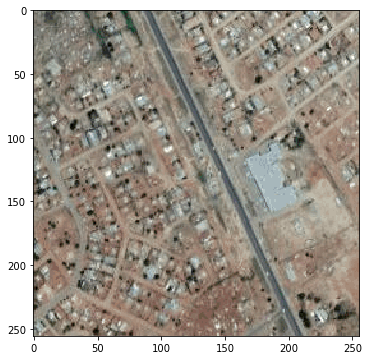

In [2]:
# load image
IMAGE = '-29.1728_26.2622.png'
img = load_images([IMAGE], '../data/Google/train/', 256, flip=False)[0]

fig = plt.figure(figsize=(6, 6))
print(img.shape)
plt.imshow(img)

# megaplot VGG16
### load model

In [3]:
# load model
MODEL = '../results/google_vgg16.h5'
model = tf.keras.models.load_model(MODEL)

# only relevant layers
layer_outputs = [layer.output for layer in model.layers[:18] if 'input' not in layer.name] 
# Extracts the outputs of the top 12 layers
viz_model = tf.keras.models.Model(
    inputs=model.input, 
    outputs=layer_outputs
) # Creates a model that will return these outputs, given the model input
print(viz_model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
image_input (InputLayer)     (None, 256, 256, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0         
__________

layer block1_conv1 (1), shape: (1, 256, 256, 64)


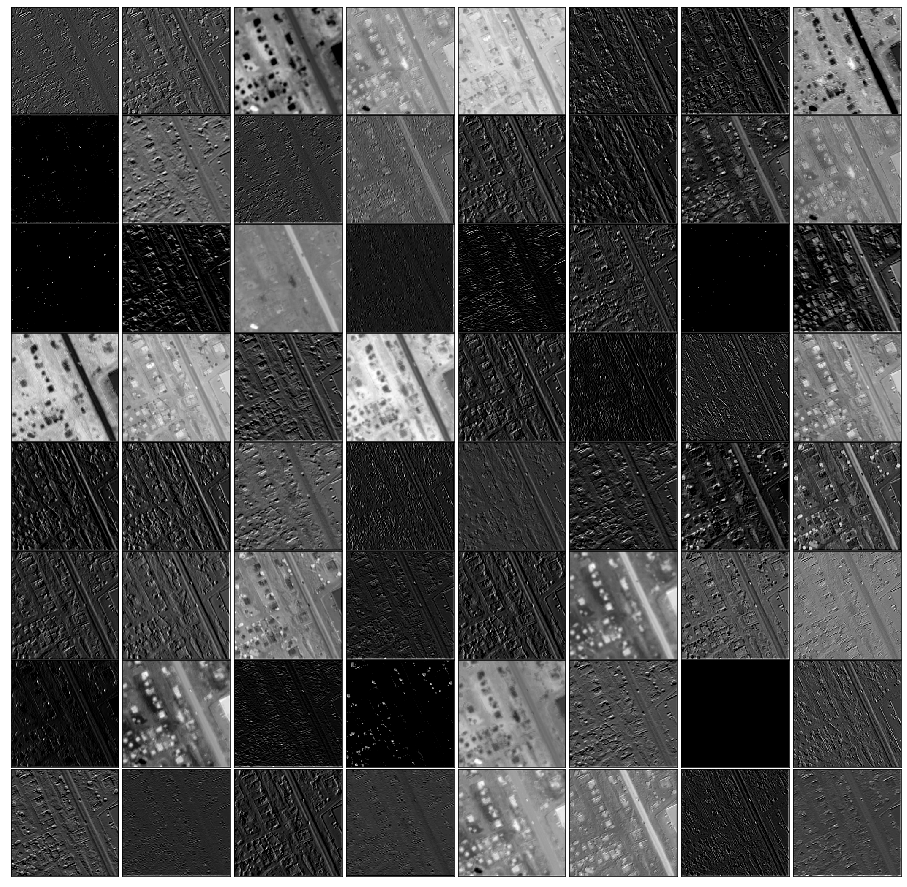

layer block1_conv2 (2), shape: (1, 128, 128, 64)


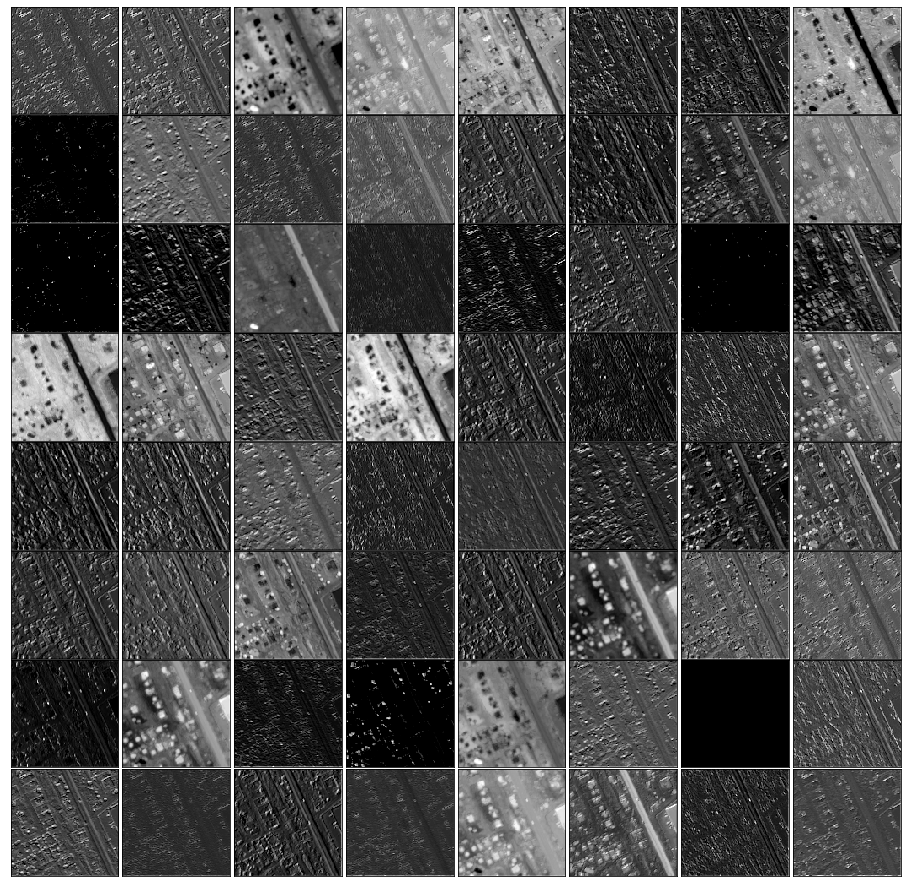

layer block2_conv1 (4), shape: (1, 128, 128, 128)


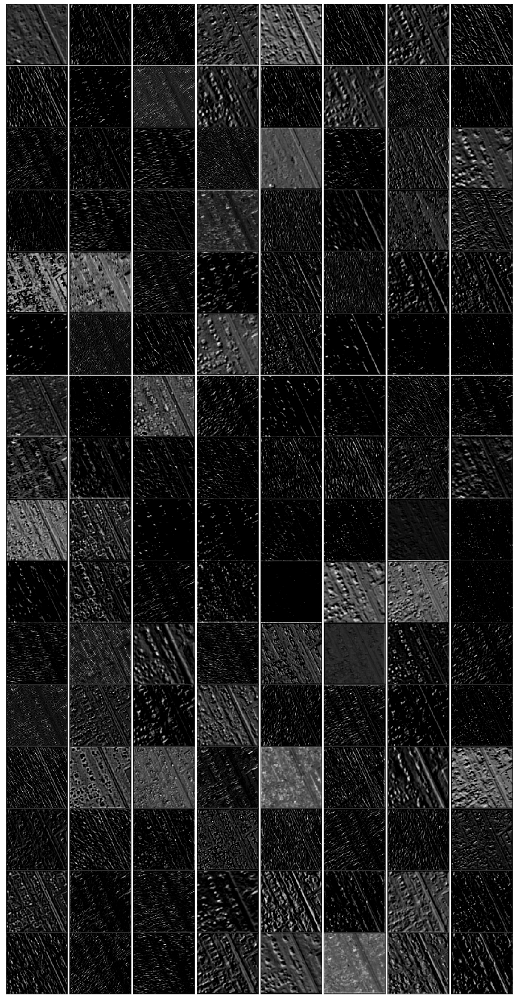

layer block2_conv2 (5), shape: (1, 64, 64, 128)


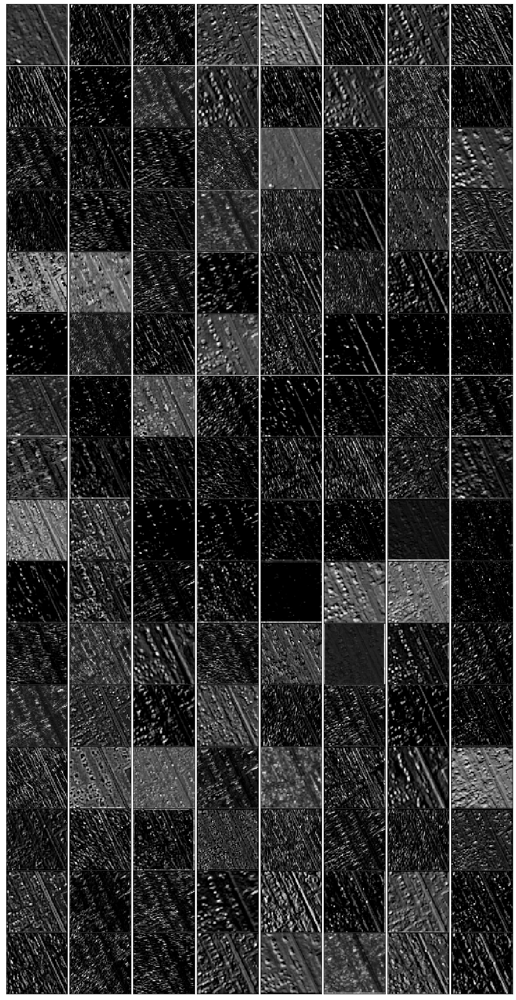

layer block3_conv1 (7), shape: (1, 64, 64, 256)


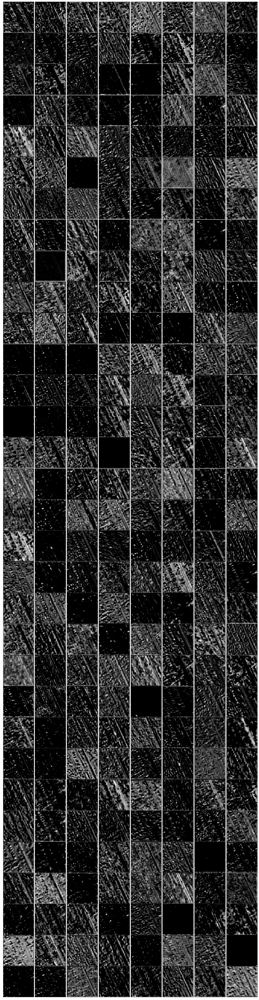

layer block3_conv2 (8), shape: (1, 64, 64, 256)


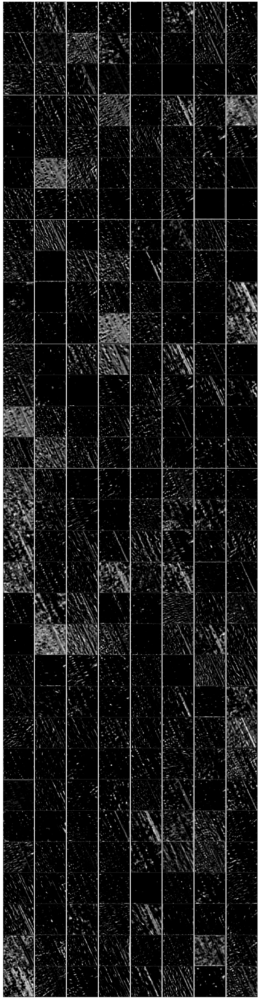

layer block3_conv3 (9), shape: (1, 32, 32, 256)


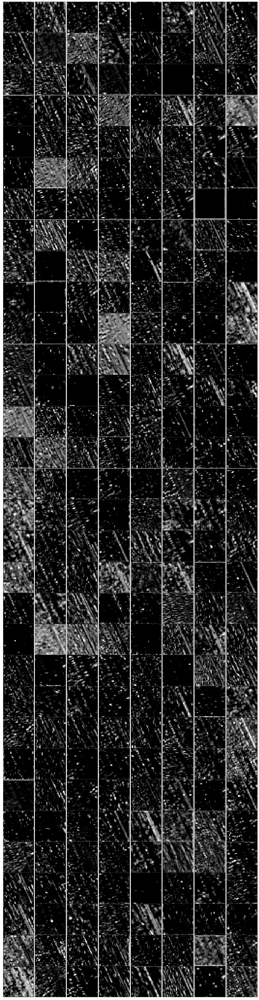

layer block4_conv1 (11), shape: (1, 32, 32, 512)


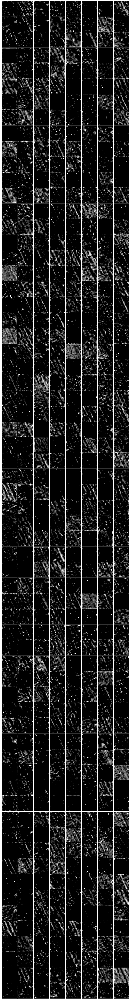

layer block4_conv2 (12), shape: (1, 32, 32, 512)


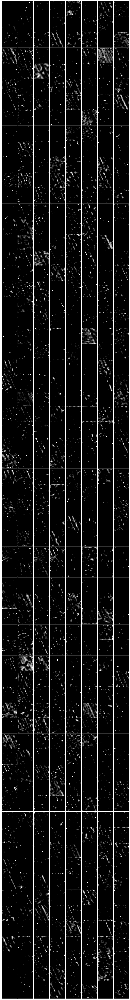

layer block4_conv3 (13), shape: (1, 16, 16, 512)


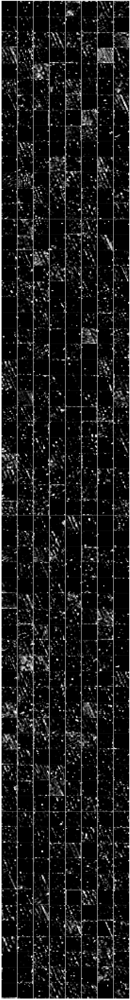

layer block5_conv1 (15), shape: (1, 16, 16, 512)


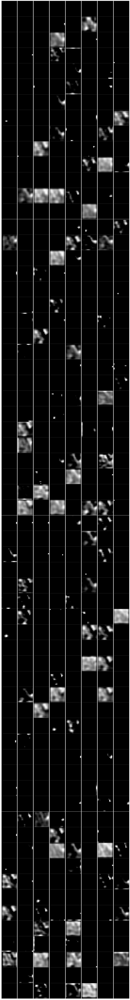

layer block5_conv2 (16), shape: (1, 16, 16, 512)


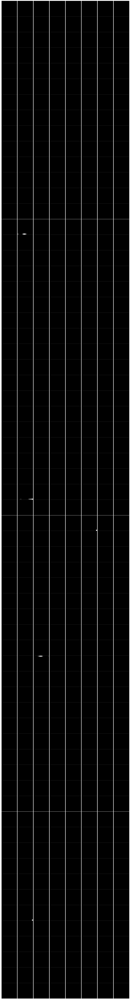

IndexError: list index out of range

In [4]:
# compute
activations = viz_model.predict(img.reshape(1, 256, 256, 3))

c = 0
for layer in model.layers:
    if 'conv' in layer.name:
        # get filter weights
        outputs = activations[c]
        print('layer {name} ({n}), shape: {shape}'.format(
            name=layer.name,
            n=c,
            shape=outputs.shape 
        ))
        ### plotting
        cols = 8
        rows= int(outputs.shape[-1]/cols)
        ix = 1
        f, axes = plt.subplots(rows, cols, figsize=(cols*2, rows*2))
        plt.subplots_adjust(hspace=.01, wspace=.01)
        for ax in axes.flatten():
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            ax.imshow(outputs[0, :, :, ix-1], cmap='gray')
            ix += 1

        # show the figure
        plt.show()
    c+=1

# simple model megaplot

In [22]:
# load model
MODEL = '../results/google_simple.h5'
model = tf.keras.models.load_model(MODEL)

# only relevant layers
layer_outputs = [layer.output for layer in model.layers[:11]] 
# Extracts the outputs of the top 12 layers
viz_model = tf.keras.models.Model(
    inputs=model.input, 
    outputs=layer_outputs
) # Creates a model that will return these outputs, given the model input
print(viz_model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_input (InputLayer)    (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 254, 254, 32)      896       
_________________________________________________________________
activation (Activation)      (None, 254, 254, 32)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 127, 127, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 125, 125, 32)      9248      
_________________________________________________________________
activation_1 (Activation)    (None, 125, 125, 32)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 62, 62, 32)        0         
__________

layer activation (1), shape: (1, 254, 254, 32)


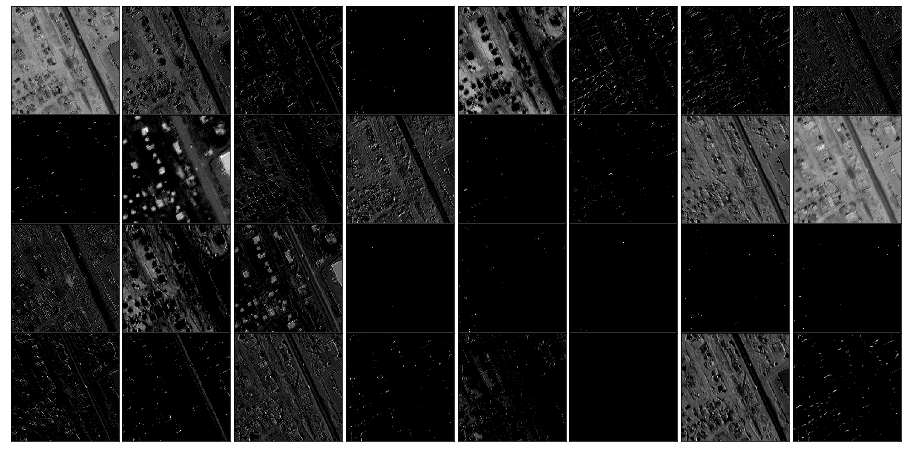

layer activation_1 (4), shape: (1, 125, 125, 32)


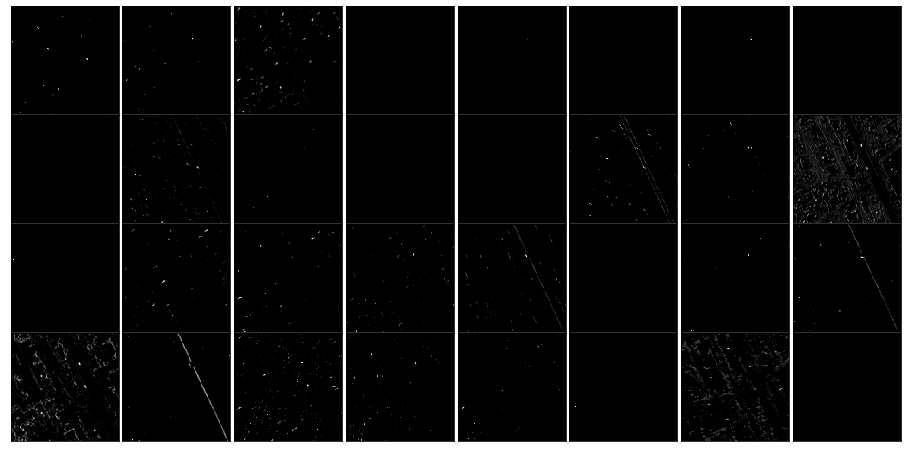

layer activation_2 (7), shape: (1, 60, 60, 64)


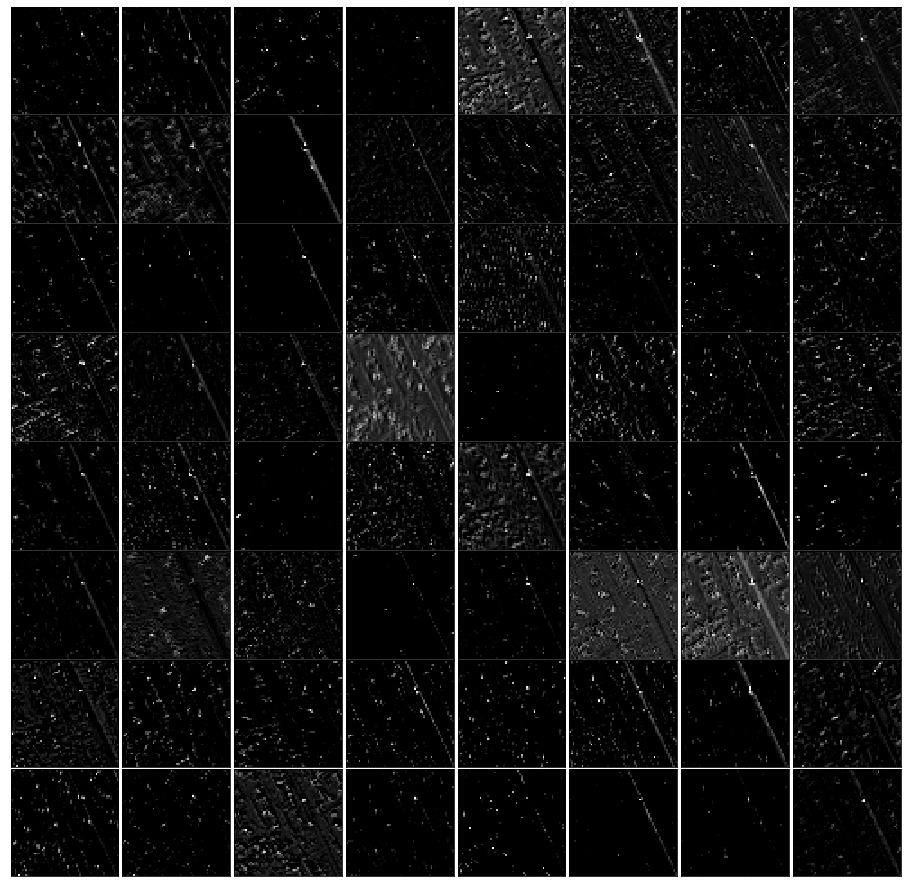

layer activation_3 (10), shape: (1, 28, 28, 64)


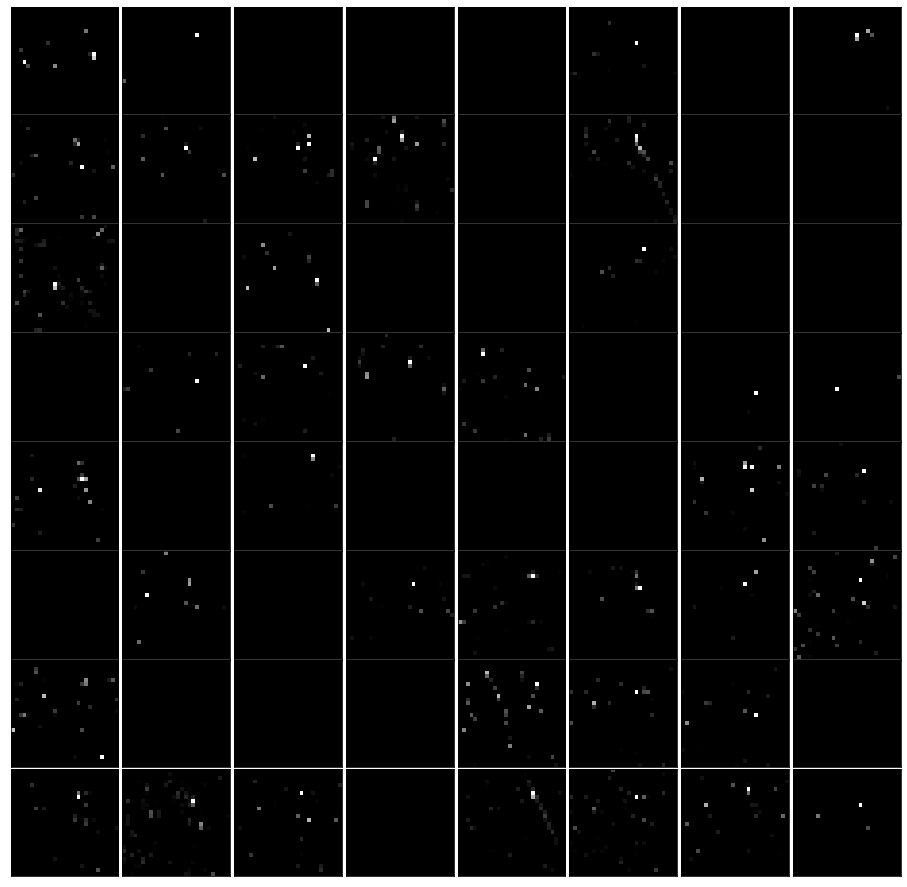

IndexError: list index out of range

In [4]:
# compute. Use 'activation layer here because the model is build with activations not embedded in the conv layer'
activations = viz_model.predict(img.reshape(1, 256, 256, 3))

c = 0
for layer in model.layers:
    if 'activation' in layer.name:
        # get filter weights
        outputs = activations[c]
        print('layer {name} ({n}), shape: {shape}'.format(
            name=layer.name,
            n=c,
            shape=outputs.shape 
        ))
        ### plotting
        cols = 8
        rows= int(outputs.shape[-1]/cols)
        ix = 1
        f, axes = plt.subplots(rows, cols, figsize=(cols*2, rows*2))
        plt.subplots_adjust(hspace=.01, wspace=.01)
        for ax in axes.flatten():
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            ax.imshow(outputs[0, :, :, ix-1], cmap='gray')
            ix += 1

        # show the figure
        plt.show()
    c+=1

## NJeans implementation

(400, 400, 3)


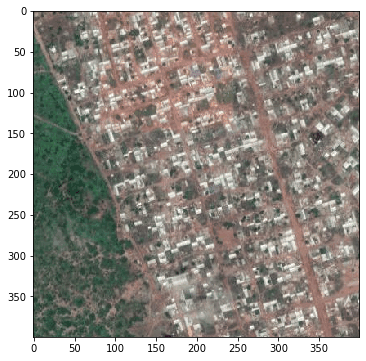

In [2]:
# load image
IMAGE = '9.4907_-5.6639.png'
img = load_images([IMAGE], '../data/Google/train/', 400, flip=False)[0]

fig = plt.figure(figsize=(6, 6))
print(img.shape)
plt.imshow(img)

In [3]:
# Njean + training model
# load model
MODEL = '../results/google_njean.h5'
model = tf.keras.models.load_model(MODEL)

# only relevant layers
layer_outputs = [layer.output for layer in model.layers[:12]] 
# Extracts the outputs of the top 12 layers
viz_model = tf.keras.models.Model(
    inputs=model.input, 
    outputs=layer_outputs
) # Creates a model that will return these outputs, given the model input
print(viz_model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1_input (InputLayer)     (None, 400, 400, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 98, 98, 64)        23296     
_________________________________________________________________
norm1 (BatchNormalization)   (None, 98, 98, 64)        256       
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 48, 48, 64)        0         
_________________________________________________________________
conv2 (Conv2D)               (None, 48, 48, 256)       409856    
_________________________________________________________________
norm2 (BatchNormalization)   (None, 48, 48, 256)       1024      
_________________________________________________________________
pool2 (MaxPooling2D)         (None, 23, 23, 256)       0         
__________

layer conv1 (0), shape: (1, 98, 98, 64)


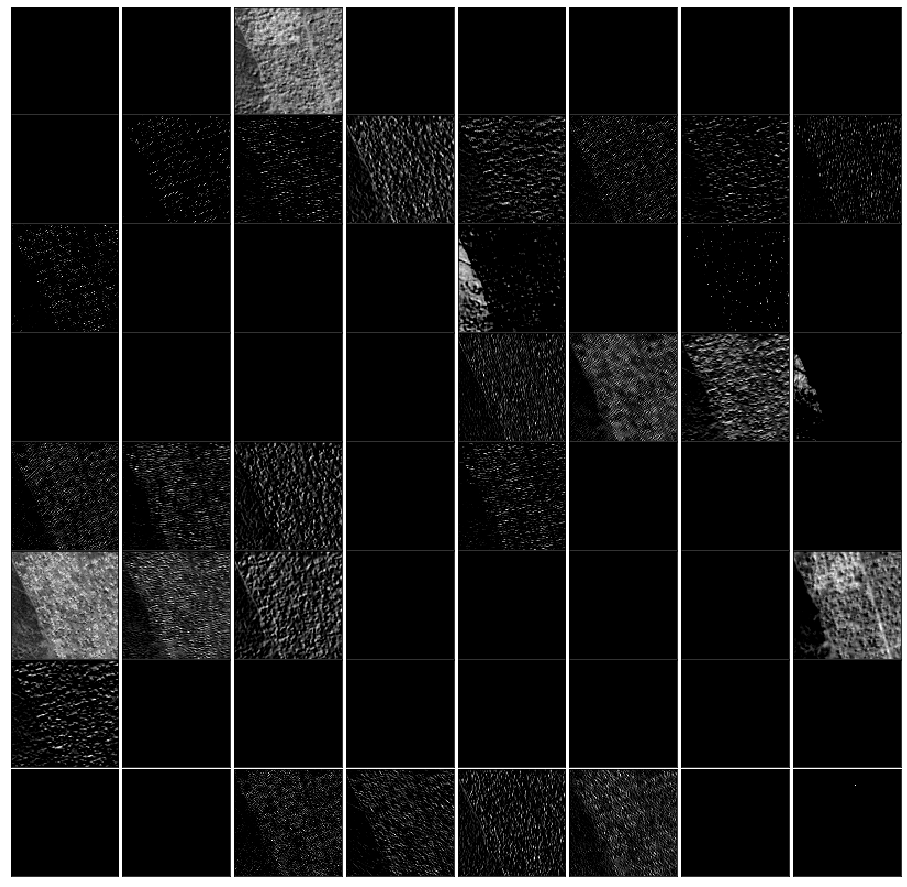

layer conv2 (3), shape: (1, 48, 48, 256)


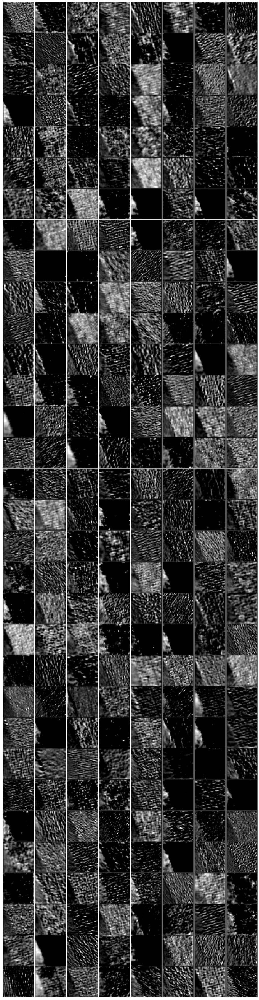

layer conv3 (6), shape: (1, 23, 23, 256)


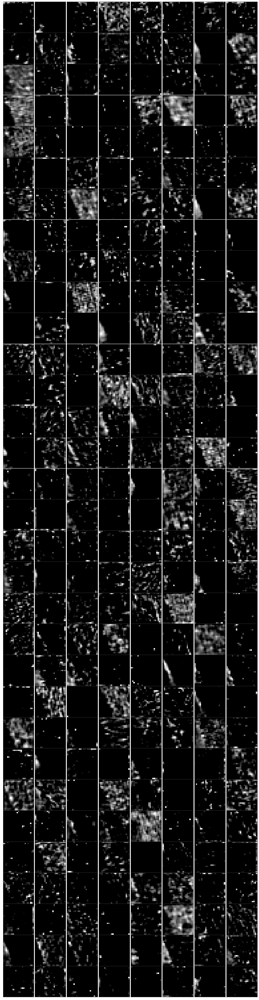

layer conv4 (8), shape: (1, 23, 23, 256)


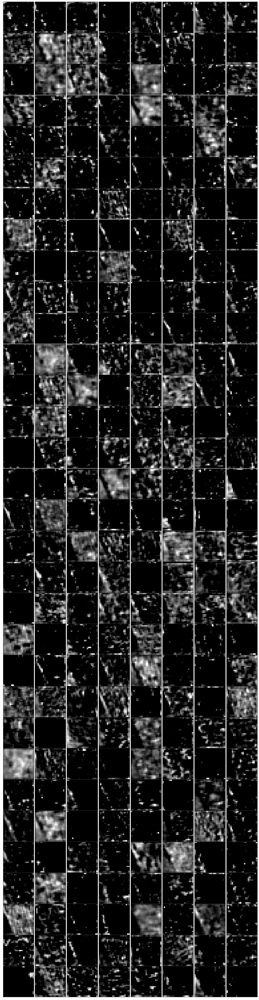

layer conv5 (10), shape: (1, 23, 23, 256)


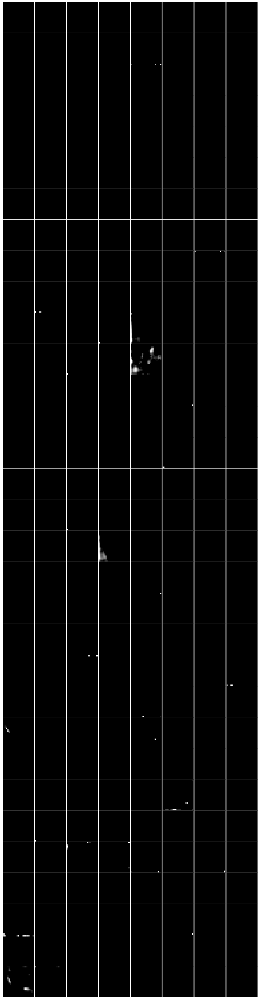

IndexError: list index out of range

In [4]:
activations = viz_model.predict(img.reshape(1, 400, 400, 3))

c = 0
for layer in model.layers:
    if 'conv' in layer.name:
        # get filter weights
        outputs = activations[c]
        print('layer {name} ({n}), shape: {shape}'.format(
            name=layer.name,
            n=c,
            shape=outputs.shape 
        ))
        ### plotting
        cols = 8
        rows= int(outputs.shape[-1]/cols)
        ix = 1
        f, axes = plt.subplots(rows, cols, figsize=(cols*2, rows*2))
        plt.subplots_adjust(hspace=.01, wspace=.01)
        for ax in axes.flatten():
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            ax.imshow(outputs[0, :, :, ix-1], cmap='gray')
            ix += 1

        # show the figure
        plt.show()
    c+=1

print the image values, the output of the flatten layer, the output of the features (i.e. the outputs) layer and  that layers' weights 

In [6]:
# the results from features
net = tf.keras.models.Model(
                inputs=model.input,
                outputs=model.get_layer('conv7').output)

# image 
print('image values: \t max -> {}, min -> {}'.format(img.max(), img.min()))

# features
res = net.predict(np.array(img).reshape(1, 400, 400, 3))
print('outputs of dense has shape \t {} max {} and min {}'.format(res.shape, res.max(), res.min()))

# weights
we = model.get_layer('conv7').get_weights()
print('coefficients: \t', we[0].max(), we[0].min())
print('bias: \t\t', we[1].max(), we[1].min())

image values: 	 max -> 0.984313725490196, min -> 0.06274509803921569
outputs of dense has shape 	 (1, 1, 1, 4096) max 0.47503042221069336 and min -0.0
coefficients: 	 0.029138688 -0.029903311
bias: 		 0.10472447 0.09381484


all weights and activations